# 3. FELADAT

## Tartsuk szem előtt!

Az ábrák legyenek áttekinthetőek, és szerepeljen rajtuk tengelyfelirat!
A kódrészletek legyenek letisztázottak, kommentek segítségével dokumentálandó minden megoldás.

In [2]:
# Ezek a csomagok kellenek/kellhetnek
from glob import glob
import cv2
import numpy as np
#import scipy.linalg
import matplotlib.pyplot as plt
from plotly import offline as plotlyol
plotlyol.init_notebook_mode()
from plotly import graph_objs as plotlygo
%matplotlib inline

# Főkomponens-analízis

A főkomponens-analízis, - más néven Karhunen-Loève-transzformáció - (angol nevén principal component analysis - PCA), egy lineáris eljárás, amely egy $D$ dimenziós vektorokból álló adathathalmazt egy ortogonális transzformáció - azaz $D$ dimenziós forgatás - segítségével olyan új bázisra visz át, ahol az adatvektorok közötti _kovariancia_ zérus. Az eredeti adatvektorok új bázis szerinti kifejtési együtthatóit főkomponens együtthatóknak nevezzük.

A főkomponens-analízis másképpen is megfogalmazható: Első lépésben keressük azt az irányvektort, melyre levetítve az adatvektorokat a projektált vektorok hosszának szórása maximálisnak adódik. Második lépésben levonjuk az adatvektorokból az így megtalált vektorra vett projekciót, majd az eljárást megismételjük oly módon, hogy megköveteljük, a következő irányvektor legyen merőleges az előzőleg megtaláltra. Az eljárást $D$-szer megismételve előáll a keresett bázis, amelyen az adatvektorokat kifejtve meghatározhatók a főkomponens együtthatók.

Jelöljük az adatvektorokat $\mathbf{x}_1, \mathbf{x}_2, ... \mathbf{x}_N$-nel, melyek mindegyike $D$ elemű. Legyen az $\mathbf{X}$ mátrix olyan, hogy sorvektoronként tartalmazza az $\mathbf{x}_i$ adatvektorokat, azaz $N$ sora és $D$ oszlopa van:

$$
X_{ij} =
\begin{bmatrix}
    x_{11}       & x_{12} & x_{13} & \dots & x_{1D} \\
    x_{21}       & x_{22} & x_{23} & \dots & x_{2D} \\
    ... \\
    x_{N1}       & x_{N2} & x_{N3} & \dots & x_{ND}
\end{bmatrix},
$$

ahol az első index az adatvektorokat, a második pedig a vektorkomponenseket indexeli.

### A kovarianciamátrix módszere

Az $X$ mátrix segítségével a főkomponens bázis megtalálására több ekvivalens módszert is találhatunk. Elsőként tekintsük az adatvektorok kovarianciamátrixát, melyet az $\mathbf{X}$ mátrix segítségével a következő alakban írhatunk:

$$
\mathbf{C} = \frac{1}{N}(\mathbf{X} - \mathbf{\mu})^\mathrm{T}(\mathbf{X} - \mathbf{\mu}),
$$

ahol $\mathbf{X} - \mathbf{\mu}$ úgy értelmezendő, hogy a mátrix minden sorából levonjuk az oszloponként vett átlagot. Könnyű látni, hogy a kovarianciamátrix mindig $D \times D$ méretű, tehát ha a a dimenziószám nagy, és kevés adatvektor van, azaz $D \gg N$, akkor a kovarianciamátrix előállítása nem célszerű.

### A duális főkomponens-analízis

Ha fennáll, hogy $D \gg N$, akkor érdemesebb a

$$
\tilde{\mathbf{C}} = \frac{1}{N}(\mathbf{X} - \mathbf{\mu})(\mathbf{X} - \mathbf{\mu})^\mathrm{T}
$$

mátrixot tekinteni, melyről belátható, hogy a $\tilde{\lambda}_i$ sajátértékei megegyeznek $\mathbf{C}$ nem zérus sajátértékeivel.
A $\tilde{\mathbf{C}}$ mátrix $\tilde{\mathbf{v}}_i$ sajátvektorai és a ${\mathbf{C}}$ mátrix $\mathbf{v}_i$ sajátvektorai között pedig fennáll, hogy

$$
\mathbf{v_i} = \frac{1}{\sqrt{N\tilde{\lambda}_i}} (\mathbf{X} - \mathbf{\mu})^\mathrm{T} \tilde{\mathbf{v}}_i.
$$

Ez utóbbi kifejezés úgy ellenőrizhető, ha felírjuk a duális problémában szereplő $(\mathbf{X} - \mathbf{\mu})(\mathbf{X} - \mathbf{\mu})^\mathrm{T}$ mátrix sajátérték-egyenletét, majd balról megszorozzuk $(\mathbf{X} - \mathbf{\mu})^\mathrm{T}$-vel.

### Főkomponens-analízis szingulárisérték-dekompozícióval

A szingulárisérték-dekompozíció (singular value decomposition - SVD) során egy tetszőleges $N \times M$ alakú mátrixot a következő módon faktorizálunk:

$$
\mathbf{A} = \mathbf{U} \mathbf{S} \mathbf{V}^\mathrm{T},
$$

ahol az $\mathbf{S}$ mátrix diagonális, és főátlójában az ún. szinguláris értékeket tartalmazza, $\mathbf{V}$ ortogonális mátrix oszlopaiban a jobboldali szinguláris vektorok, $\mathbf{U}$ ortogonális mátrix oszlopaiban pedig a baloldali szinguláris vektorok jelennek meg. A szinguláris értékek száma $K = \min(M, N)$, $\mathbf{U}$ és $\mathbf{V}$ pedig általában $N \times N$ és $M \times M$ alakú mátrixok. Belátható, hogy

* az $\mathbf{U}$ oszlopaiban lévő baloldali szinguláris vektorok azonosak az $\mathbf{A}\mathbf{A}^\mathrm{T}$ mátrix ortonormált sajátvektoraival
* a $\mathbf{V}$ oszlopaiban lévő jobboldali szinguláris vektorok azonosak az $\mathbf{A}^\mathrm{T}\mathbf{A}$ mátrix ortonormált sajátvektoraival
* a nem zérus szinguláris értékek azonosak $\mathbf{A}\mathbf{A}^\mathrm{T}$ és $\mathbf{A}^\mathrm{T}\mathbf{A}$ nem zérus sajátértékeinek négyzetgyökeivel.

Ezek figyelembe vételével a főkomponens-analízis közvetlenül SVD segítségével is elvégezhető, tekintve, hogy

$$
\mathbf{A}^\mathrm{T}\mathbf{A} = 
  (\mathbf{V} \mathbf{S}^\mathrm{T} \mathbf{U}^\mathrm{T})(\mathbf{U} \mathbf{S} \mathbf{V}^\mathrm{T}) = 
  \mathbf{V} \mathbf{S}^\mathrm{T} (\mathbf{U}^\mathrm{T} \mathbf{U}) \mathbf{S} \mathbf{V}^\mathrm{T} =
  \mathbf{V} \mathbf{S}^\mathrm{T} \mathbf{S} \mathbf{V}^\mathrm{T} =
  \mathbf{V} \mathbf{S}^2 \mathbf{V}^\mathrm{T}.
$$
Megjegyzendő, hogy komplex $\mathbf{A}$ esetén $\mathbf{U}$ és $\mathbf{V}$ unitér, és a transzponálások helyett adjungálást kell végezni.

A szingulárisérték-dekompozíció megvalósítására léteznek hatékony algoritmusok, így a kovarianciamátrix előállítása általában nem célszerű, de ha mégis szükséges, akkor többnyire a sajátérték-probléma megoldására is SVD-t használunk.

### A főkomponens együtthatók meghatározása

Fejtsük ki az eredeti adatvektorokat a kovarianciamátrix sajátvektorai által definiált bázison, azaz határozzuk meg az adatvektorok főkomponens együtthatóit! Ehhez elegendő belátni, hogy ezek előállnak a következő alakban:

$$
\mathbf{PC} = (\mathbf{X} - \mathbf{\mu}) \mathbf{V},
$$

ahol $\mathbf{V}$ a normált sajátvektorokból, mint oszlopvektorokból alkotott mátrix.

### Dimenzióredukció főkomponens-analízis segítségével

A kovarianciamátrix sajátértékei azt adják meg, hogy a nekik megfelelő sajátvektorokkal kijelölt irányokban mekkora az adatvektorok szórása. Belátható, hogy ha csak a néhány legnagyobb sajátértékhez tartozó sajátvektort, és az  ezeknek megfelelő főkomponens együtthatót tartjuk meg, akkor az adatvektoroknak egy olyan projekciójához jutunk, mely számot ad az adatokban rejlő variancia nagy részéről, viszont figyelmen kívül hagyja azokat az irányokat, amelyekben inkább csak _zaj_ látható. Emiatt a főkomponensanalízis hatékony lineáris adattömörítési, illetve zajszűrési eljárás is.

Ha a nagy dimenziószám nem indokolja, akkor a legnagyobb sajátértékek előállításához célszerű az SVD-n alapuló módszert alkalmazni, ugyanis az SVD-algoritmusok eleve nagyság szerint csökkenő sorrendben adják vissza a szinguláris értékeket. Ilyenkor a főkomponenseket nem a teljes sajátbázisra számítjuk ki, hanem csak az első $k$ legnagyobb szinguláris értékhez tartozó szinguláris vektort tartjuk meg a $\mathbf{V}$ mátrixból, és így végezzük el a korábbi kifejtést:

$$
\mathbf{PC}^{(k)} = (\mathbf{X} - \mathbf{\mu}) \mathbf{V}^{(k)},
$$

# Feladatok

## 1.a feladatrész: Főkomponens-analízis kis dimenziószám mellett

Talán nem köztudott, de Dobó István és seregének hősies várvédése után néhány évtizeddel a törökök mégis elfoglalták Eger várát, amelyet végül 335 évvel ezelőtt foglaltak vissza. Az egyik ostromnál egy fizikus-tanonc mérte az ágyúgolyók röptének időtartamát, a leérkezés távolságát és az árnyék mozgásából meghatározta a vízszintes sebességkomponens értékét is. Mivel egy lövéssorozatban sem sikerült pontosan egyformán lőni a golyókat, ezek egy-egy átlagos érték körül szóródó értékek.
Viszont fizikai tanulmányainkból tudjuk, hogy mindhárom mennyiség a kezdeti sebesség és emelkedési szög függvénye. Ha ez alapján modellezzük a mérési eredményeket, akkor azt kell lássuk, hogy a 3 mennyiség 3D terében egy 2D halmazt alkotnak, ami kis eltérések esetén síkkal közelíthető. Persze a mérési hibák miatt e sík kis környezetébe szóródnak a pontok, mint az alábbi 3 dimenziós ábrán láthatjuk. (Bár ezek különböző dimenziójú/mértékegységű mennyiségek, az összehasonlíthatóség kedvéért dimenziótlanítva, azaz természetes egységekbe átszámolva szerepelnek az adatok a beolvasott fájlban.)

E 3D ábra megjelenítéséhez lehetséges, hogy le kell futtatni e cellát (meg a notebook elején lévő csomagbetöltéseket).

In [2]:
t,l,vx=np.loadtxt("/v/courses/fiznum2.public/pca/demo-PCA.dat").T  # Így a fájl 3 oszlopa kerül a 3 változóba
trace = plotlygo.Scatter3d(x=t, y=l, z=vx, mode='markers',marker=dict(size=1),legendgroup="data") # Adatok csoportosítása trace-be
w=np.loadtxt("/v/courses/fiznum2.public/pca/demo-PCA-vect.dat")  # A demohoz rendelkezésre állnak itt a kovarianciamátrix sajátvektorai
mx=np.mean(t)                                    # de a saját munkához ki kell majd számolni
my=np.mean(l)
mz=np.mean(vx)
r=0.2              # a vektorok hossza
tracev0 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,0]], y=[my,my+r*w[1,0]], z=[mz,mz+r*w[2,0]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev1 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,1]], y=[my,my+r*w[1,1]], z=[mz,mz+r*w[2,1]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev2 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,2]], y=[my,my+r*w[1,2]], z=[mz,mz+r*w[2,2]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
layout3d = plotlygo.Layout(title='Ferde hajítás adatai egérrel zoomolható és forgatható ábrán')
fig_3D = plotlygo.Figure(data=[trace,tracev0,tracev1,tracev2],layout=layout3d)  # ábra objektum létrehozása
plotlyol.iplot(fig_3D)  # az ábra megjelenítése

A főkomponensanalízis segítségével megtalálhatjuk azt a lokális 2D koordinátarendszert, amihez a pontok jól illeszkednek. Ráadásul a két új koordináta korrelációja 0, tehát további vizsgálatokra a nagy adathalmaz modellezhető 2 függgetlen véletlen változóval. Ezeket megkapjuk, ha az adatok átlagtól való eltérésvektorait skalárszorzat végzésével vetítjük a sajátvektorokra. A vetítéssel kapott értékeket 2D-ben ábrázolva a ponthalmazt közelítő síkot forgatjuk be a 2D ábránkba:
![demo2d.png](demo2d.png)

A feladat nem a fenti, hanem egy új adatsor elemzése, amit a
"/v/courses/fiznum2.public/pca/work-PCA.dat"
fájlból kell betölteni.
Ebben soronként vannak egy mérésből kapott x,y,z értékek, sok mérés egymás után.
Készítsünk az adatokról a fentihez hasonló 3D scatter ábrát! 

Utána számítsuk ki az adatvektorok kovarianciamátrixát, majd oldjuk meg a kovarianciamátrix sajátérték-problémáját! Módosítsuk a 3D ábránkat úgy, hogy az adatpontokra rárajzoljuk a kovarianciamátrix sajátvektorait, a fenti bemutatóhoz hasonlóan. Ügyeljünk arra, hogy a sajátvektorokat a ponthalmaz súlypontjából kiindulva kell ábrázolni! Fogalmazzuk meg 1-2 mondatban, hogy mit várhatunk a sjátvektorok irányára, és hogy ez teljesül-e!

Írassuk ki az adathalmaz síkjához tartozó sajátértékek négyzetgyökeinek hányadosát! Fogalmazzuk meg, hogy ez az adathalmaz milyen tulajdonságával kapcsolatos!

Végül határozzuk meg, és ábrázoljuk az adatvektorok főkomponens együttható-vektorait azonos osztásközű skálák mellett! Mit figyelhetünk meg?

In [3]:
x, y, z=np.loadtxt("/v/courses/fiznum2.public/pca/work-PCA.dat").T  # Így a fájl 3 oszlopa kerül a 3 változóba
trace = plotlygo.Scatter3d(x=x, y=y, z=z, mode='markers',marker=dict(size=1),legendgroup="data") # Adatok csoportosítása trace-b

In [4]:
len(x)  #Ennyi adat lesz a mátrixban

2021

In [5]:
layout3d = plotlygo.Layout(title='A work fájlban tárolt hajítási adatok')
fig_3D = plotlygo.Figure(data=[trace],layout=layout3d)  # ábra objektum létrehozása
plotlyol.iplot(fig_3D)  # az ábra megjelenítése

In [6]:
X = np.vstack((x,y,z)).T           #Az adatokat az X mátrixban tárolom

In [7]:
X

array([[2.988, 4.802, 5.798],
       [1.457, 2.984, 4.74 ],
       [2.384, 3.998, 5.732],
       ...,
       [4.378, 2.821, 5.465],
       [6.404, 3.676, 6.066],
       [5.083, 2.552, 5.227]])

In [8]:
Xm = X-X.mean(axis=0)            #Az adatokból kivonom az oszloponkénti átlagot

In [9]:
Xm

array([[ 0.97174715,  1.79450915,  0.79217714],
       [-0.55925285, -0.02349085, -0.26582286],
       [ 0.36774715,  0.99050915,  0.72617714],
       ...,
       [ 2.36174715, -0.18649085,  0.45917714],
       [ 4.38774715,  0.66850915,  1.06017714],
       [ 3.06674715, -0.45549085,  0.22117714]])

In [10]:
N = len(x)
kovarainciamatrix = 1/(N)*Xm.T@Xm

In [11]:
kovarainciamatrix

array([[6.42434812, 1.25544709, 1.46980871],
       [1.25544709, 1.21813819, 0.65321964],
       [1.46980871, 0.65321964, 0.49963072]])

In [12]:
sajatertek, sajatvektorok = np.linalg.eig(kovarainciamatrix)

In [13]:
sajatertek

array([7.09018994, 1.02996422, 0.02196287])

In [14]:
sajatvektorok

array([[ 0.94525488,  0.29357594, -0.14250049],
       [ 0.22806117, -0.90662372, -0.35499511],
       [ 0.23341234, -0.30306203,  0.92394377]])

In [15]:
vektorhossz = np.linalg.norm(sajatvektorok[0])

In [16]:

w=sajatvektorok  # A demohoz rendelkezésre állnak itt a kovarianciamátrix sajátvektorai
mx=np.mean(x)                                    # de a saját munkához ki kell majd számolni
my=np.mean(y)
mz=np.mean(z)
r= vektorhossz              # a vektorok hossza
tracev0 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,0]], y=[my,my+r*w[1,0]], z=[mz,mz+r*w[2,0]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev1 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,1]], y=[my,my+r*w[1,1]], z=[mz,mz+r*w[2,1]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
tracev2 = plotlygo.Scatter3d(x=[mx,mx+r*w[0,2]], y=[my,my+r*w[1,2]], z=[mz,mz+r*w[2,2]],
                             mode='lines',marker=dict(size=1))  # sajátvektor berajzolása
layout3d = plotlygo.Layout(title='Ferde hajítás számított adatai egérrel zoomolható és forgatható ábrán')
fig_3D = plotlygo.Figure(data=[trace,tracev0,tracev1,tracev2],layout=layout3d)  # ábra objektum létrehozása
plotlyol.iplot(fig_3D)  # az ábra megjelenítése

A sajátvektorok irányára előzetesen az az elvárásunk. hogy azok páronként egymásra merőlegesek legyenek. Két vektornak a pontok által kijelölt síkba kell esnie, egynek pedig merőlegesnek kell lennie az bárára. A sajátvektrok hossza minden esetben ugyan az.

In [17]:
sajatertek

array([7.09018994, 1.02996422, 0.02196287])

In [18]:
gyokossajetertekek = np.sqrt(sajatertek)          #A sajátétékek gyökei

In [19]:

print(gyokossajetertekek[0]/gyokossajetertekek[1])  #Ezt a síkot hagyjuk ki a vetítésből, mivel itt a legkisebb a 
                                                    #sajátértékek gyökének hányadosa

print(gyokossajetertekek[0]/gyokossajetertekek[2])

print(gyokossajetertekek[1]/gyokossajetertekek[2])

2.6237222986768165
17.967364401539413
6.848043487910528


In [20]:


scatterplot = Xm@sajatvektorok   #A harmadik dimenziót dobom el

Text(0.5, 1.0, 'A hajítás adatainak két dimenziós ábrája')

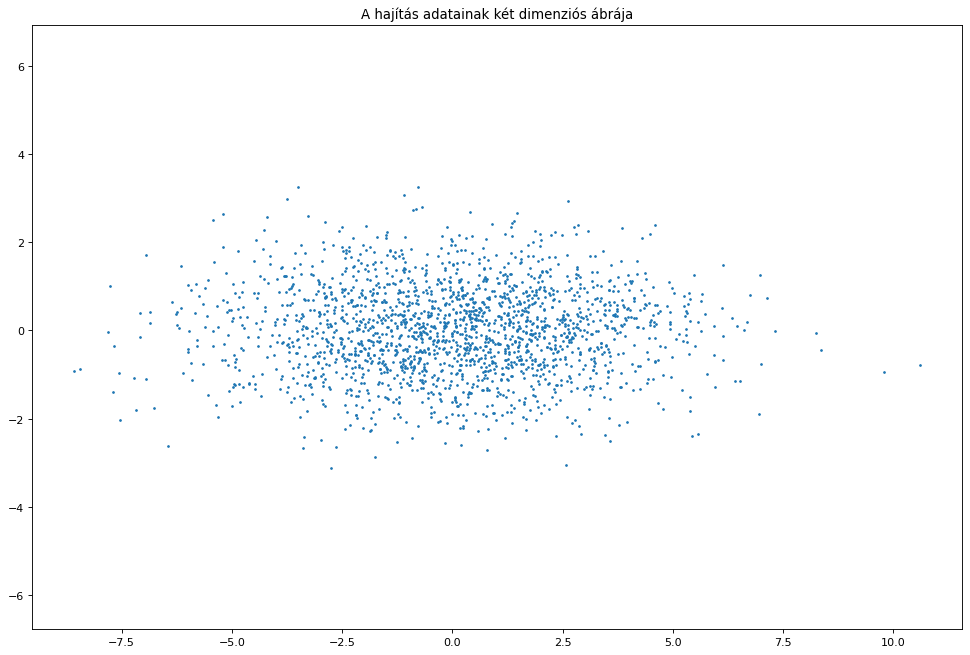

In [101]:
plt.figure(figsize=(15, 10), dpi=80)

plt.scatter(scatterplot[:, 0], scatterplot[:, 1], s=2)
plt.axis('equal')
plt.title("A hajítás adatainak két dimenziós ábrája")


## 1.b feladatrész
Végezzük el az előző feladatrész számításait most a kovarianciamátrix meghatározása helyett közvetlenül szingulárisérték-dekompozícióval! Hogyan kaphatjuk vissza az SVD eredményéből a kovarianciamátrix sajátértékeit? Írassuk ki a jobboldali szinguláris vektorokat és szinguláris értékeket mindkét számítás alapján, hogy összehasonlítható legyen!
Ábrázoljuk az adatvektorok itt kapott főkomponens együtthatóit is 2D-ben!

In [22]:
U, S, VT = np.linalg.svd(Xm, full_matrices=False)


In [23]:


svdkovarianciamatrix = VT.T @ (np.diag(S**2) / (2021 - 1)) @ VT



In [24]:
print (svdkovarianciamatrix)
print()
print(kovarainciamatrix)

#Látható hogy a megkapott értékek nagyon közel esnek egymáshoz, többnyire a harmadik tizedesjegyben térnek el. 


[[6.42752849 1.2560686  1.47053633]
 [1.2560686  1.21874123 0.65354301]
 [1.47053633 0.65354301 0.49987807]]

[[6.42434812 1.25544709 1.46980871]
 [1.25544709 1.21813819 0.65321964]
 [1.46980871 0.65321964 0.49963072]]


In [25]:
svdsajatertek, svdsajatvektorok = np.linalg.eig(kovarainciamatrix)

In [26]:
print(sajatertek)

print(S**2/2021)   #Ugyan azokat az értékeket kapom meg a sajátértékekre, mint a kovarianciamátrix előállításakor

[7.09018994 1.02996422 0.02196287]
[7.09018994 1.02996422 0.02196287]


In [27]:
C = np.cov(X, rowvar=False)

In [28]:
C

array([[6.42752849, 1.2560686 , 1.47053633],
       [1.2560686 , 1.21874123, 0.65354301],
       [1.47053633, 0.65354301, 0.49987807]])

In [29]:
#A jobboldali sajátvektorok kovarianciamtárix módszerrel

sajatertekazonos, sajatvektorazonos = np.linalg.eig(Xm.T@Xm)


In [30]:
sajatvektorazonos   

array([[ 0.94525488,  0.29357594, -0.14250049],
       [ 0.22806117, -0.90662372, -0.35499511],
       [ 0.23341234, -0.30306203,  0.92394377]])

In [31]:
#A jobboldali szinguláris  vektorok az SVD módszerrel

VT.T           #A beolvasott vtranszponált sajátvektor transzponáltját képzem 

array([[-0.94525488, -0.29357594,  0.14250049],
       [-0.22806117,  0.90662372,  0.35499511],
       [-0.23341234,  0.30306203, -0.92394377]])

In [32]:
svdsajatvektorok        #Látható, hogy az SVD-módszerrel kapott számok és a sajátértékek előjelben térnek el egymástól, 
                        #a megkapott számok abszolút értéke megegyezik.

array([[ 0.94525488,  0.29357594, -0.14250049],
       [ 0.22806117, -0.90662372, -0.35499511],
       [ 0.23341234, -0.30306203,  0.92394377]])

In [33]:
svdscatterplot = Xm@svdsajatvektorok   #A harmadik dimenziót dobom el

In [34]:
sajatvektorok

array([[ 0.94525488,  0.29357594, -0.14250049],
       [ 0.22806117, -0.90662372, -0.35499511],
       [ 0.23341234, -0.30306203,  0.92394377]])

Text(0.5, 1.0, 'A hajítás adatainak két dimenziós ábrázolása')

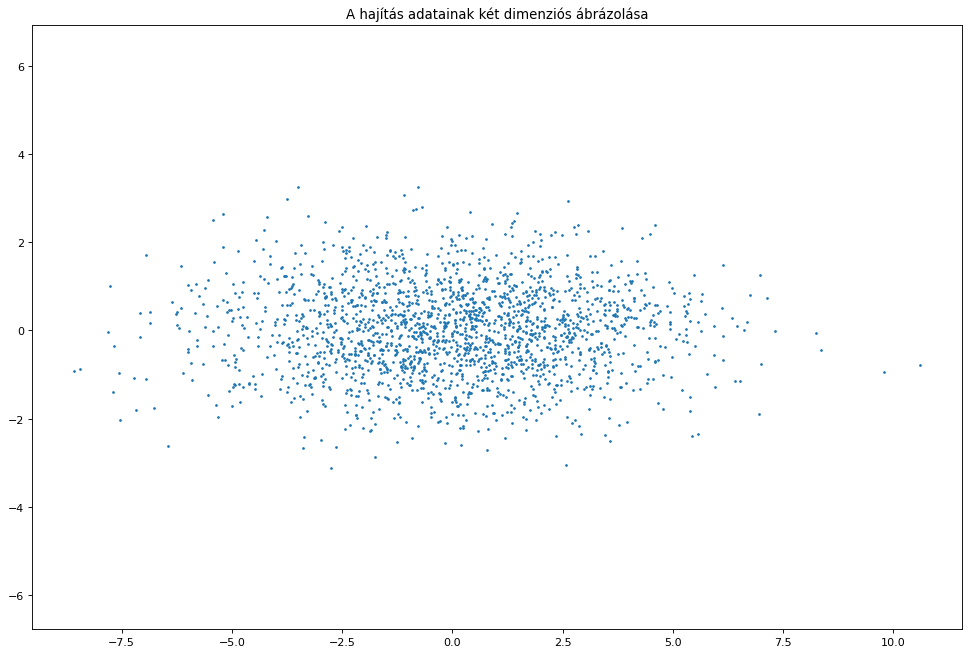

In [100]:
plt.figure(figsize=(15, 10), dpi=80)

plt.scatter(svdscatterplot[:, 0], svdscatterplot[:, 1], s=2)
plt.axis('equal')
plt.title("A hajítás adatainak két dimenziós ábrázolása")


## 2. feladatrész - Sajátarcok meghatározása

Az 1. feladatrészben sikerült az adatok dimenzióját csökkenteni. Ez nyilván főleg nagyobb dimenziószám esetén hasznos, gondolhatunk 1-10-100 dimenziós adatvektorokra.
Az alábbi példában még ennél is nagyobb dimenzóval lesz dolgunk. Fekete-fehér fényképek esetén egy adatvektor annyi dimenziós, amennyi pixelből áll a kép (színes kép esetén ez szorzandó a színkomponensek számával).

A következő cellában szereplő függvény az argumentumként megadott mappából megfelelő formátumú fájlokat tölt be. 
Az azt követő  cellában látottak szerint lehet e függvénnyel az előkészített 
$N=94$ kutyafényképet betölteni  egy `numpy` adattömbbe. Az adattömb indexei a következők:

* 1: A fénykép sorszáma 0-tól
* 2: A fényképek sorainak száma (290)
* 3: A fényképek oszlopainak száma (220)

A szürkeárnyalatos fényképek úgy ábrázolódnak a számítógépben, hogy minden pixelhez egy 0 és 255 közötti egész szám tartozik (uint8 adattípus). A 0 érték fekete pixelt, a 255 fehéret, a köztes értékek pedig egy lineáris skálán a szürke különböző árnyalatait jelentik. A képek megjelenítésére a `matplotlib.pyplot.imshow` parancsa használható, az alábbi példák szerint.

A feladat az lesz, hogy alakítsük át a képeket adatvektorrá (például a `reshape`, `flatten` vagy `ravel` függvény segítségével), majd végezzük el az adatvektorok főkomponens bázis analízisét. Ez azt jelenti, hogy határozzuk meg azt a bázist, melyen a képekből készített adatvektorok korrelálatlanok. Mivel jelen esetben a $D = 290 \cdot 220 = 63800$ dimenziószám jóval nagyobb, mint $N$, a képek száma, ezért a bevezetőben említett lehetőségek közül csak a duális-PCA jöhet szóba. 

* ábrázoljuk a sajátértékeket csökkenő sorrendben, a sorszámuk függvényében

* alakítsuk vissza a sajátvektorokat képpé, és ábrázoljuk az első $42$ sajátértékhez tartozó sajátvektorokat



In [3]:
# Ezeket még segítségül megadjuk
def load_pics(s):
    files = glob(s)
    img = cv2.imread(files[0])
    imgs = np.empty((len(files), img.shape[0], img.shape[1]), dtype=np.uint8)
    for i in range(0, len(files)):
        imgs[i,:,:] = cv2.imread(files[i])[:,:,0]
    return imgs

In [4]:
imgs = load_pics('/v/courses/fiznum2.public/pca/101puppies/database/*.jpg')
n, h, w = imgs.shape
print (f'{n} dogs ({w}x{h})')

94 dogs (220x290)


In [5]:
h


290

In [6]:
import matplotlib

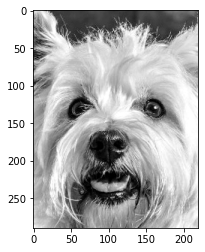

In [7]:
matplotlib.pyplot.imshow(imgs[93], cmap='gray', vmin=0, vmax=255)

In [8]:
kutyasX = np.empty((94, 63800))         #Itt hozom létre az üres mátrixot

In [9]:
for i in range(94):
    row_element = imgs[i].reshape(h * w) # Itt adom be a mátrixba a soronkénti adatokat
    kutyasX[i] = row_element

In [10]:
kutyasX

array([[194., 164., 124., ..., 114., 103.,  98.],
       [ 55.,  55.,  58., ..., 226., 216., 200.],
       [215., 212., 213., ...,  89.,  84.,  87.],
       ...,
       [194., 199., 199., ...,  30.,  32.,  22.],
       [  0.,   0.,   0., ..., 188., 186., 194.],
       [220., 215., 232., ..., 227., 224., 220.]])

In [11]:
kutyasX.mean(axis=0)

array([114.88297872, 113.44680851, 113.92553191, ..., 112.32978723,
       112.0212766 , 114.10638298])

In [12]:
#A duális-főkomponmens-analízis megvalósítása

kutyasXmean = kutyasX-kutyasX.mean(axis=0)

In [13]:
N = 94
kutyakov = 1/(N)*kutyasXmean @ kutyasXmean.T

In [14]:
kutyasajatertek, kutyasajatvektorok = np.linalg.eig(kutyakov)

In [15]:
kepeksorszama = np.linspace(0, 93, num=94)

Text(0.5, 1.0, 'A sajátértékek a kép sorszámának függvényében')

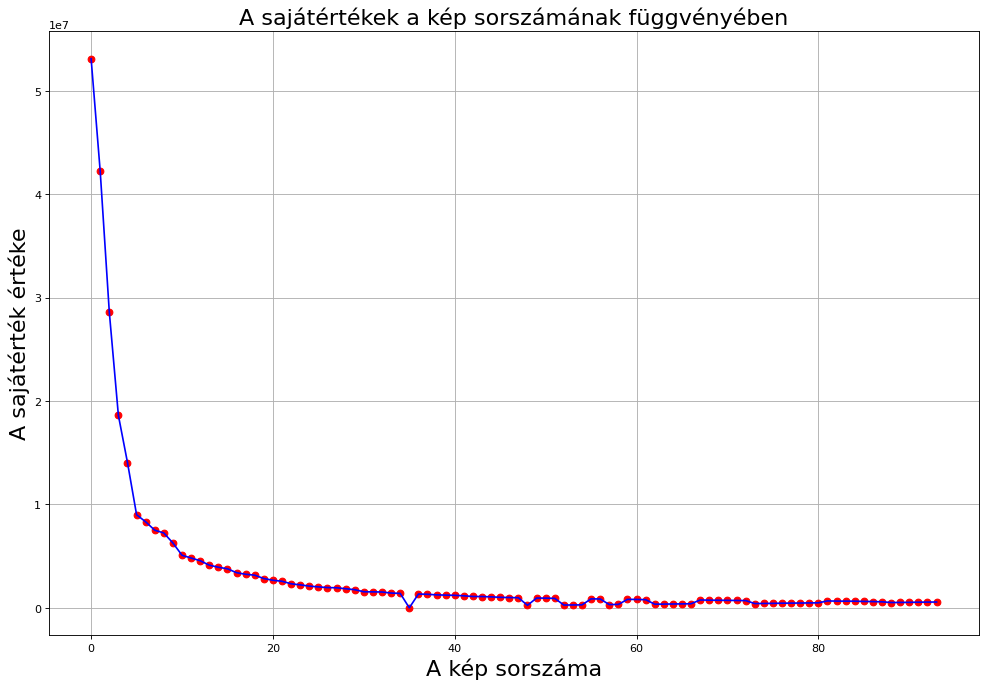

In [16]:
plt.figure(figsize=(15, 10), dpi=80)
plt.plot(kepeksorszama, kutyasajatertek, 'ro')
plt.plot(kepeksorszama, kutyasajatertek, 'b-')

plt.grid()
plt.xlabel("A kép sorszáma", fontsize="20")
plt.ylabel("A sajátérték értéke", fontsize="20")
plt.title("A sajátértékek a kép sorszámának függvényében", fontsize=20)



In [17]:
sorrend = np.argsort(kutyasajatertek)[::-1]

In [18]:
kutyasajatertek = abs(kutyasajatertek[sorrend])

kutyasajatvektorok= kutyasajatvektorok[sorrend]

In [26]:
kutyasajatvektorok.shape

(94, 94)

Text(0.5, 1.0, 'A rendezett sajátértékek a kép sorszámának függvényében')

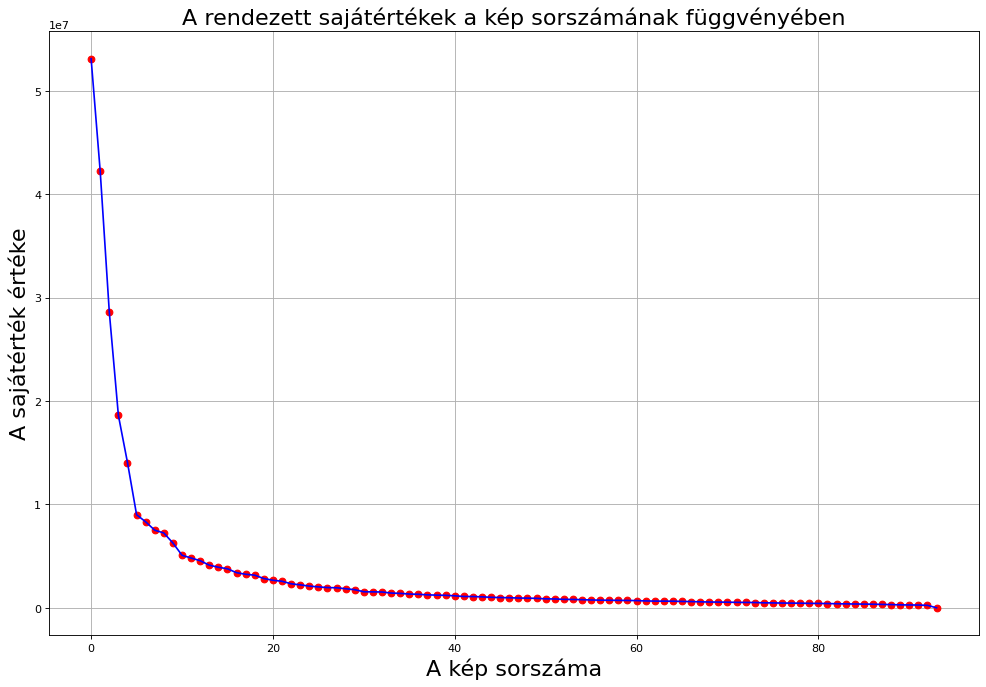

In [19]:
plt.figure(figsize=(15, 10), dpi=80)
plt.plot(kepeksorszama, kutyasajatertek, 'ro')
plt.plot(kepeksorszama, kutyasajatertek, 'b-')

plt.grid()
plt.xlabel("A kép sorszáma", fontsize="20")
plt.ylabel("A sajátérték értéke", fontsize="20")
plt.title("A rendezett sajátértékek a kép sorszámának függvényében", fontsize=20)

In [20]:
#Az adatvektorok transzformálása

transzfolmaltsajatvektor = []

for i in range(94):
    
    transzformaltsajatvektorval = kutyasXmean.T@kutyasajatvektorok[:,i]/(np.sqrt(94*kutyasajatertek[i]))
    
    transzfolmaltsajatvektor.append(transzformaltsajatvektorval)
    

    

In [27]:
elsokep = transzfolmaltsajatvektor[0].reshape(h, w)

In [30]:
elsokep.max()

0.0037701201857783463

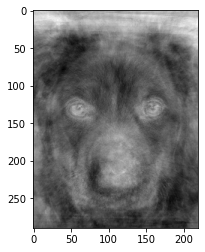

In [31]:
matplotlib.pyplot.imshow(-elsokep, cmap='gray')

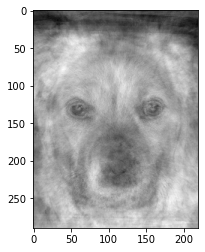

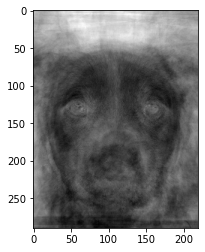

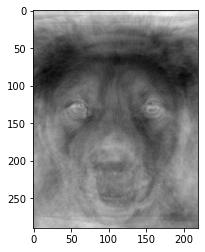

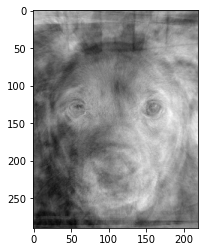

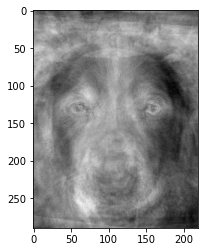

...

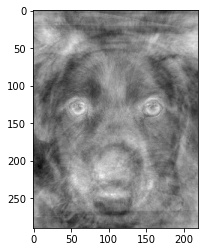

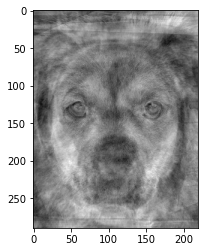

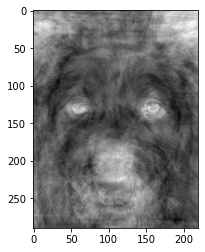

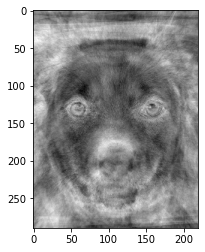

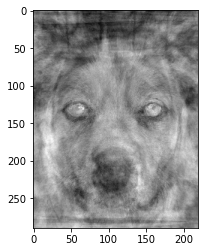

In [56]:
visszaalakitottkepek = np.array([[]])
for k in range(0, 42):
    
    kep = transzfolmaltsajatvektor[k].reshape(h, w)
    
    matplotlib.pyplot.imshow(kep, cmap='gray')
    
    plt.show()


### SVD-vel való megvalósítás

In [33]:
Ukutya, Skutya, VTkutya = np.linalg.svd(kutyasXmean, full_matrices=False)


In [34]:
np.shape(VTkutya)

(94, 63800)

In [35]:
kutyakovmtr = np.dot(Ukutya, np.dot(np.diag(Skutya**2), Ukutya.T))


In [36]:
eigvals = Skutya ** 2

# Compute eigenvectors
eigvecs = Ukutya

# Normalize eigenvectors
eigvecs_norm = eigvecs / np.linalg.norm(eigvecs, axis=0)

In [37]:
transzfolmaltsajatvektor2 = []

for i in range(94):
    
    transzformaltsajatvektorval = kutyasXmean.T@eigvecs[:,i]/(np.sqrt(94*eigvals[i]))
    
    transzfolmaltsajatvektor2.append(transzformaltsajatvektorval)

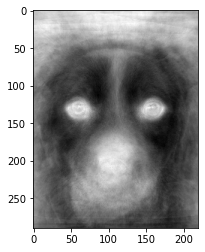

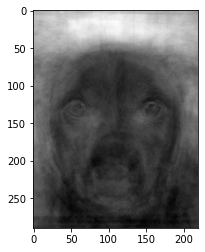

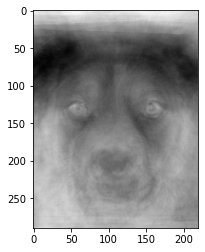

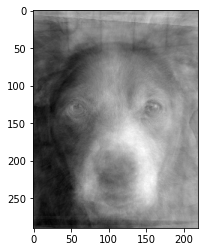

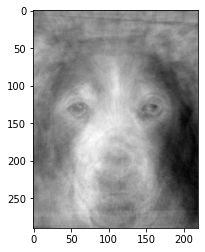

...

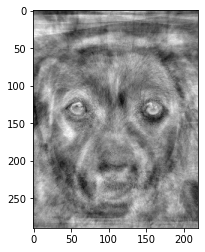

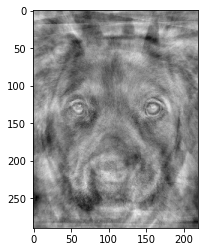

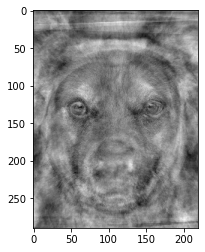

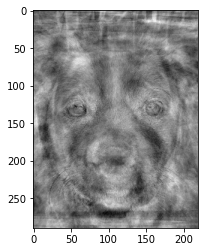

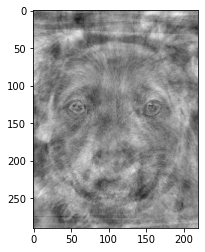

In [38]:
for k in range(0, 42):
    
    kep = transzfolmaltsajatvektor2[k].reshape(h, w)
    
    matplotlib.pyplot.imshow(kep, cmap='gray')
    
    plt.show()

In [40]:
transzfolmaltsajatvektor2[0].max()

0.00029222838122366267

In [63]:
#Látható, hogy az SVD-vel megkapott képek különböznek a duális PCA segítségével megkapottaktól. A Duális PCA során negatív
#sajátértéket is kapok (lásd ábrán szereplő 35. pont), negatív érték SVD alkalmazása esetén nem jelenik meg.

#A np.linalg.svd függvény csökkenő sorrendben adja vissza a sajátértékeket, ezekből tartottam meg az első 42-t.

# 3. feladatrész

### a) 
A második feladatrészben meghatározott $N=42$ legnagyobb sajátértékekhez tartozó sajátvektorok segítségével a $94$ elemű bázis helyett egy csonkolt bázist definiálhatunk, olymódon, hogy csak ezeket a  sajátvektorokat tartjuk meg.  Határozzuk meg az eredeti, $94$ képhez tartozó főkomponens együtthatókat a csonkolt bázison! 

### b)
A fentebb kiszámolt főkomponens együtthatók és a csonkolt bázis segítségével keszítsük el az első $17$ kutya-arc csonkolt bázison történő rekonstrukcióját! Alakítsuk vissza kép formába az eredményt és mutassuk be egymás mellett az eredeti és rekonstruált képeket!

### c)
Próbáljuk tovább csökkenteni a kifejtéshez használt bázisvektorok számát és figyeljük meg, hogy hány bázisvektor megtartása esetén maradnak a kutya-arcok még felismerhetőek? Ezt úgy valósítsuk meg, hogy a b) részben már kiszámolt főkomponens együtthatókból kevesebbet tartunk meg. Rövid szöveges választ is várunk.

In [63]:
uj_bazis = transzfolmaltsajatvektor[:94]       #A sajátvektoroknak csak az első 42 elemét tartom meg


In [64]:
np.shape(transzfolmaltsajatvektor[:94])

(94, 63800)

In [65]:
type(transzfolmaltsajatvektor)

numpy.ndarray

In [66]:
transzfolmaltsajatvektor = np.array(transzfolmaltsajatvektor)

In [67]:
PC = kutyasXmean @ transzfolmaltsajatvektor[:94].T                    #Itt az értékekekt soronként olvastam be, ezért 
                                                                      #szükséges a transzponáltat használni.

In [68]:
len(PC)                     #A PC mátrixban tárolódnak a főkomponens együtthatók, az adott elem az adott képhez tartozó
                            #együtthatót adja meg

94

In [69]:
ujkepek = []

for k in range(17):

    elem = (PC @ transzfolmaltsajatvektor[:94] + kutyasX.mean(axis=0))[k].reshape(290,220)
    
    ujkepek.append(elem)
    
ujkepek = np.array(ujkepek)

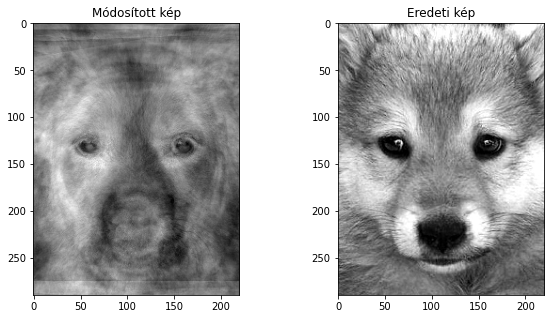

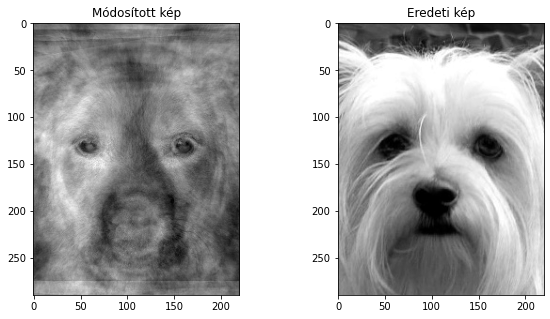

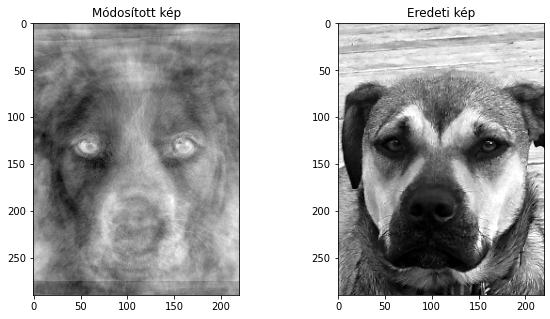

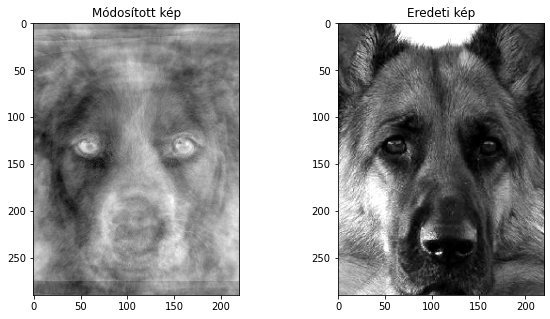

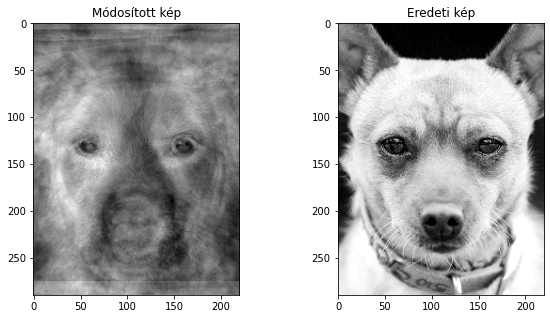

...

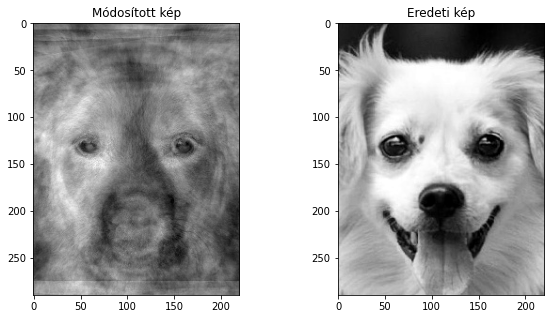

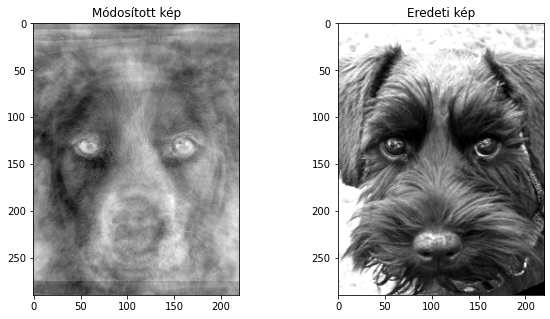

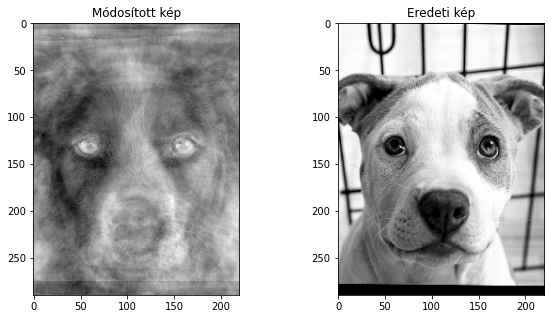

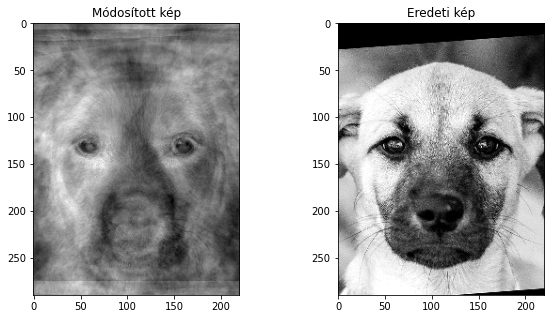

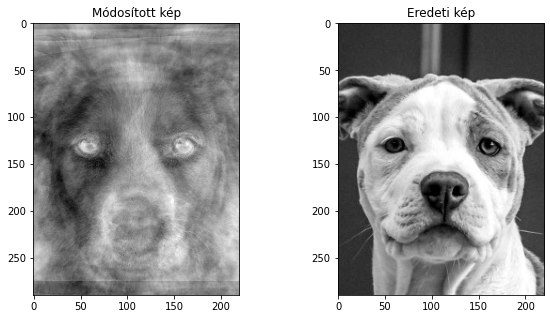

In [70]:


for i in range(0, 16):
    img1 = ujkepek[i]
    img2 = imgs[i]

    # create a figure with two subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # plot the first image on the first subplot
    axs[0].imshow(img1, cmap='gray')

    # plot the second image on the second subplot
    axs[1].imshow(img2, cmap='gray')

    # set the titles for the subplots
    axs[0].set_title('Módosított kép')
    axs[1].set_title('Eredeti kép')

    # show the figure
    plt.show()


# Megvalósítás az SVD-vel megkapott eredmlnyeket felhasználva

In [71]:
uj_bazis2 = transzfolmaltsajatvektor2[:94]       

In [72]:
uj_bazis2 = np.array(uj_bazis2)

In [73]:
PC2 = kutyasXmean @ uj_bazis2.T

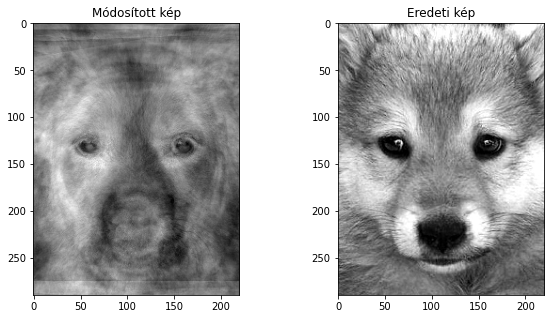

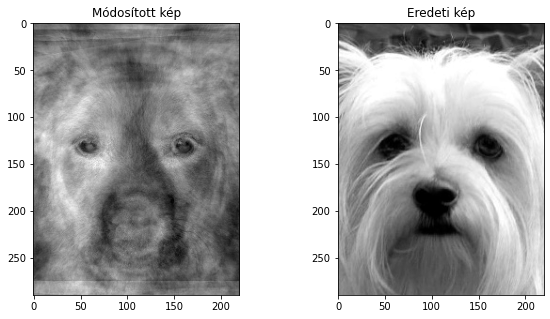

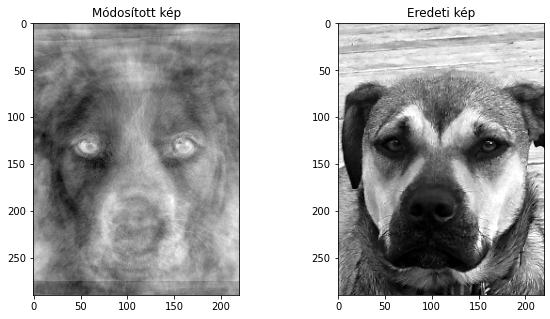

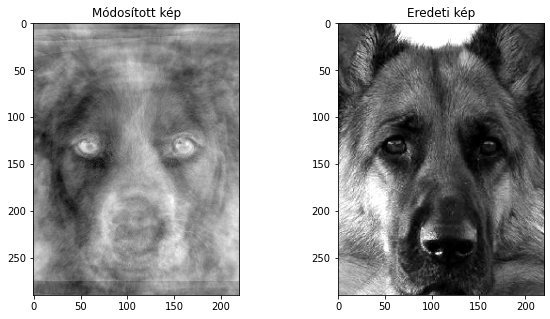

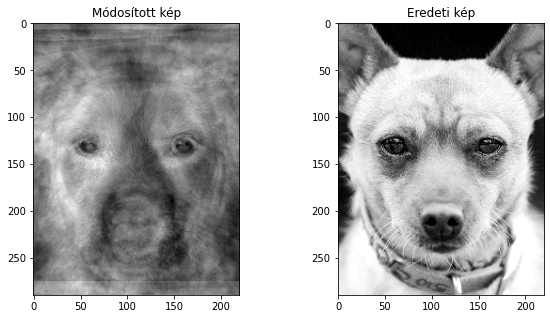

...

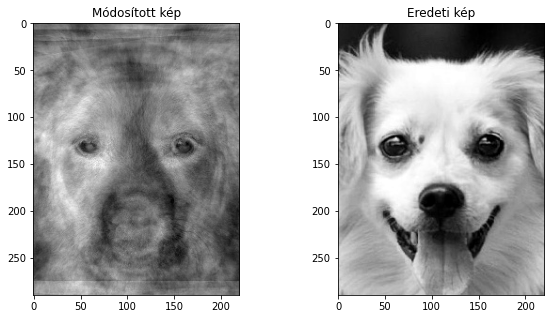

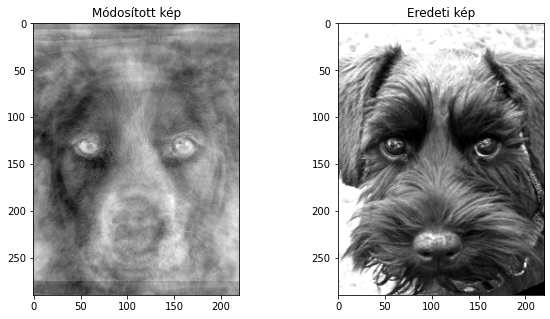

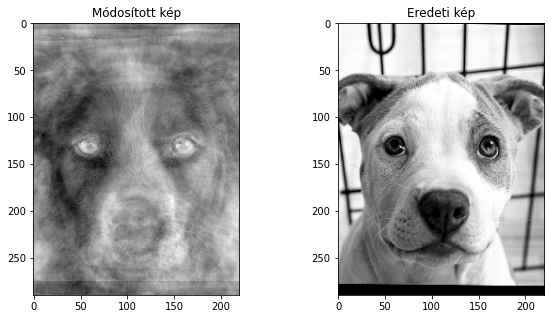

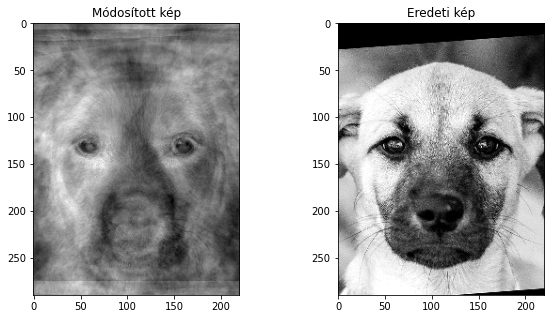

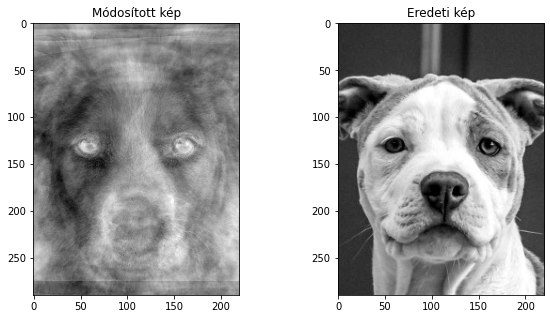

In [74]:
ujkepek2 = []

for k in range(17):

    elem = (PC2 @ transzfolmaltsajatvektor[:94] + kutyasX.mean(axis=0))[k].reshape(290,220)
    
    ujkepek2.append(elem)
    
ujkepek2 = np.array(ujkepek)


for i in range(0, 16):
    img1 = ujkepek2[i]
    img2 = imgs[i]

    # create a figure with two subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # plot the first image on the first subplot
    axs[0].imshow(img1, cmap='gray')

    # plot the second image on the second subplot
    axs[1].imshow(img2, cmap='gray')

    # set the titles for the subplots
    axs[0].set_title('Módosított kép')
    axs[1].set_title('Eredeti kép')

    # show the figure
    plt.show()

In [45]:
#c feladatrész

In [77]:
PCuj = kutyasXmean @ transzfolmaltsajatvektor[:35].T



In [78]:
ujkepek3 = []

ujkepek4= []

for k in range(17):

    elem = (PCuj @ transzfolmaltsajatvektor[:35] + kutyasX.mean(axis=0))[k].reshape(290,220)
    
    
    
    ujkepek3.append(elem)
    
    
    
    
    
ujkepek3 = np.array(ujkepek3)



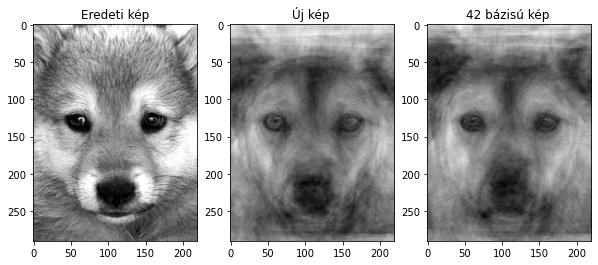

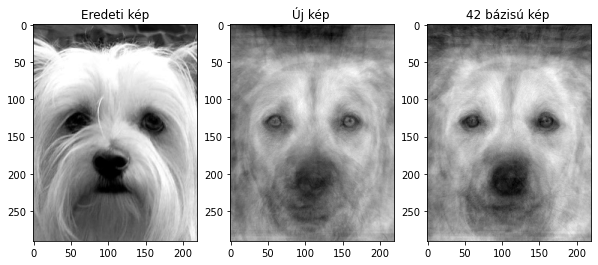

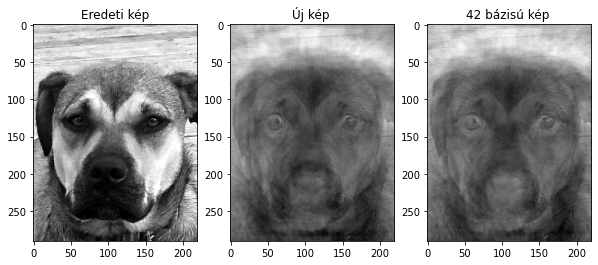

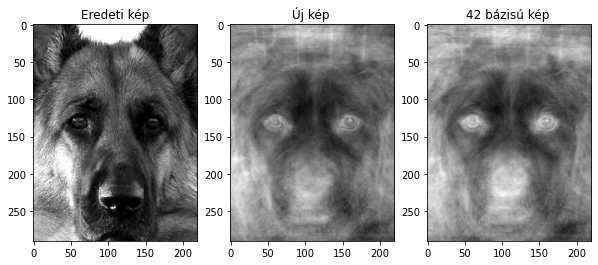

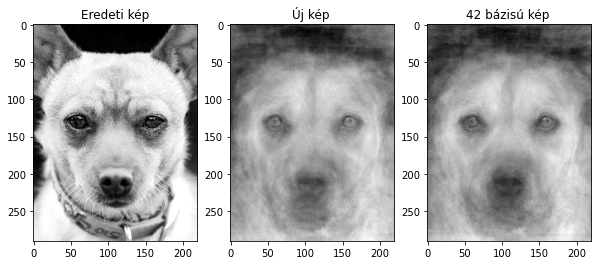

...

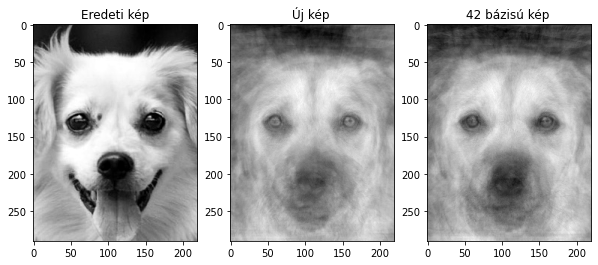

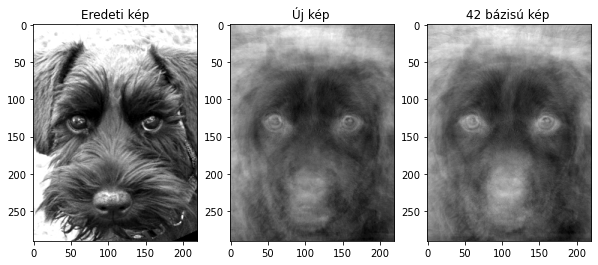

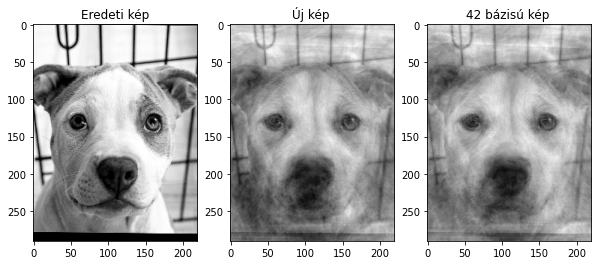

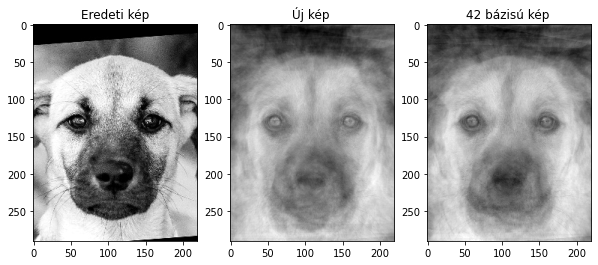

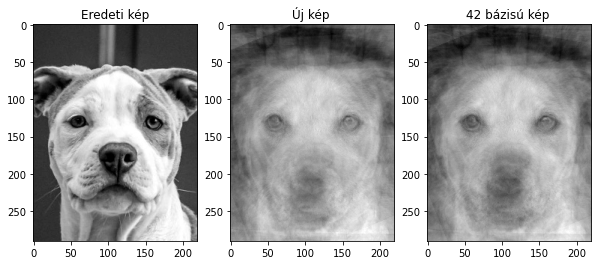

In [79]:


for i in range(0, 16):
    img1 = ujkepek3[i]             #A legkisebb számú vektorral kifejtett képek
    img2 = imgs[i]                 #Az eredeti képek
    img3 = ujkepek[i]              #A 42 adatvektorral kifejtett képek

    # Három képet jelenítek meg egyszerre
    fig, axs = plt.subplots(1, 3, figsize=(10, 5))

    # az első kép
    axs[0].imshow(img2, cmap='gray')

    # a második kép
    axs[1].imshow(img1, cmap='gray')
    
    # a harmadik kép
    axs[2].imshow(img3, cmap='gray')
    


    # Képcímek sorrendben
    axs[0].set_title('Eredeti kép')
    axs[1].set_title('Új kép ')
    axs[2].set_title('42 bázisú kép ')

    # Megjelenítés
    plt.show()


In [80]:
#Megfigyelhető, hogy kevésszámú bázisvektor megtartása esetén csak az arc, az orrok, stb.vagyis a 
#kutyaarc főbb jellemzői rajzolódnak ki, 
#míg amennyiben nagyobbszámú bázist tartunk meg, úgy a részletek, mint például a háttér, stb. is kivehetővé válnak.   

In [81]:
#35 bázis megtartása esetén még felismerhetőnek tekinthettem a képeket, a fentebbi grafikonon ez látható

# 4. feladatrész

A második feladatban meghatározott $N=42$ bázisvektort felhasználhatjuk olyan képek kifejtésére is, amelyek nem szerepeltek abban az adatbázisban, amely segítségével
eredetileg meghatároztuk őket. Fejtsük ki a  /v/courses/fiznum2.public/pca/101puppies/compare/ mappában levő képeket ezen a bázison, majd visszaalakítva az eredményt képpé, ellenőrizzük, hogy mennyire hasonlóak az eredetihez? 
Rövid szöveges választ is várunk.

In [82]:
imgs2 = load_pics('/v/courses/fiznum2.public/pca/101puppies/compare/*.jpg')
n2, h2, w2 = imgs.shape
print (f'{n} dogs ({w}x{h})')

94 dogs (220x290)


In [83]:
ismeretlenkutyasX = np.empty((7, 63800))         #Itt hozom létre az üres mátrixot amiben a kutyák adattömbjeit
                                                 #tárolom majd

In [84]:
for i in range(7):
    row_element = imgs[i].reshape(h * w) # Itt adom be a mátrixba a soronkénti adatokat
    ismeretlenkutyasX[i] = row_element

In [85]:
np.shape(ismeretlenkutyasX)

(7, 63800)

In [86]:
ismeretlenkutyasXmean = ismeretlenkutyasX-ismeretlenkutyasX.mean(axis=0)

In [87]:

ismeretlenkutyakov = 1/(7)*ismeretlenkutyasXmean @ ismeretlenkutyasXmean.T

In [88]:
ismeretlenkutyasajatertek, ismeretlenkutyasajatvektorok = np.linalg.eig(ismeretlenkutyakov)

In [89]:
sorbarendezett = np.argsort(ismeretlenkutyasajatertek)[::-1]

In [90]:
ismeretlenkutyasajatertek, ismeretlenkutyasajatvektorok = abs(ismeretlenkutyasajatertek[sorbarendezett]), ismeretlenkutyasajatvektorok[sorbarendezett]

In [91]:
#Az adatvektorok transzformálása

ismeretlentranszfolmaltsajatvektor = []

for i in range(7):
    
    transzformaltsajatvektorval = ismeretlenkutyasXmean.T@ismeretlenkutyasajatvektorok[:,i]/(np.sqrt(7*ismeretlenkutyasajatertek[i]))
    
    ismeretlentranszfolmaltsajatvektor.append(transzformaltsajatvektorval)
    


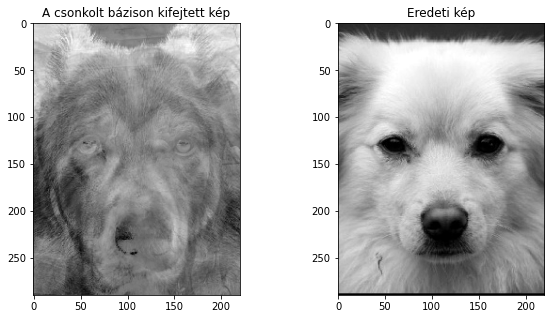

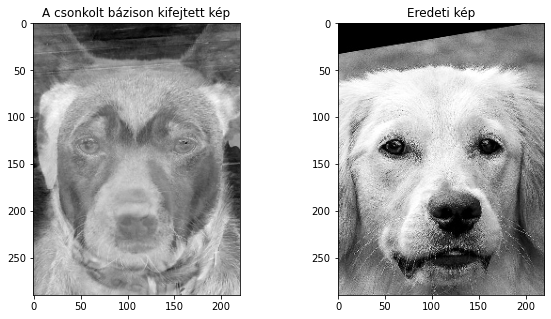

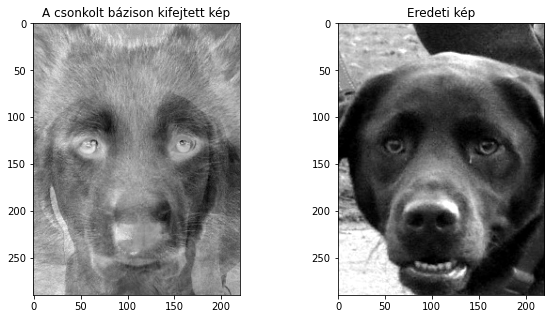

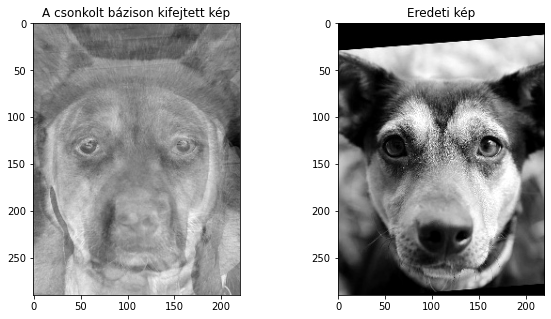

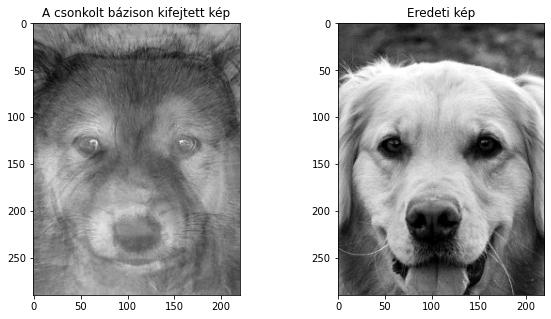

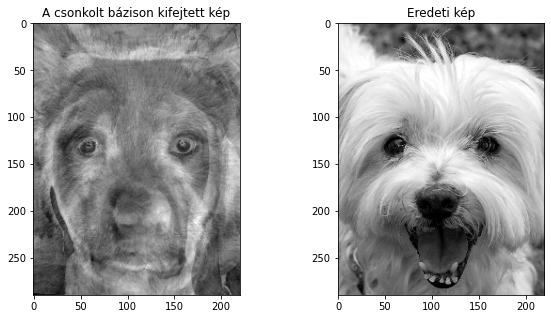

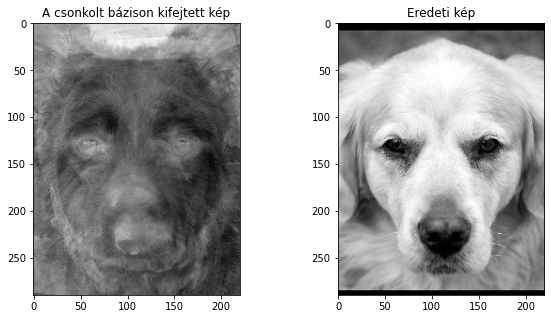

In [92]:
for i in range(0, 7):
    img1 = ismeretlentranszfolmaltsajatvektor[i].reshape(h2, w2)
    img2 = imgs2[i]

    # create a figure with two subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # plot the first image on the first subplot
    axs[0].imshow(img1, cmap='gray')

    # plot the second image on the second subplot
    axs[1].imshow(img2, cmap='gray')

    # set the titles for the subplots
    axs[0].set_title('A csonkolt bázison kifejtett kép')
    axs[1].set_title('Eredeti kép')

    # show the figure
    plt.show()

# SVD-vel való kifejtés

In [93]:
Uujkutya, Sujkutya, VTujkutya = np.linalg.svd(ismeretlenkutyasXmean, full_matrices=False)


In [94]:
kutyakovmtr2 = np.dot(Uujkutya, np.dot(np.diag(Sujkutya**2), Uujkutya.T))


In [95]:
eigvals2 = Sujkutya ** 2

# Sajátvektorok
eigvecs2 = Uujkutya

# Normalizált sajátvektorok
eigvecs_norm2 = eigvecs2 / np.linalg.norm(eigvecs2, axis=0)

In [96]:
transzfolmaltsajatvektoruj = []

for i in range(7):
    
    transzformaltsajatvektorval = ismeretlenkutyasXmean.T@eigvecs2[:,i]/(np.sqrt(7*eigvals2[i]))
    
    transzfolmaltsajatvektoruj.append(transzformaltsajatvektorval)
    
transzfolmaltsajatvektoruj = np.array(transzfolmaltsajatvektoruj)

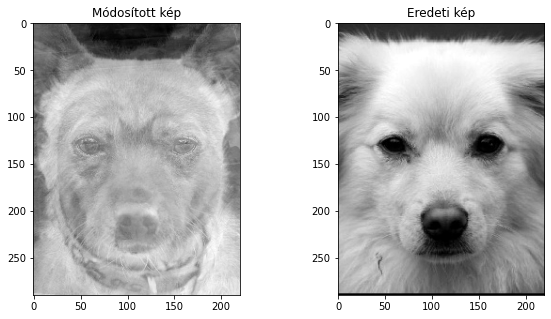

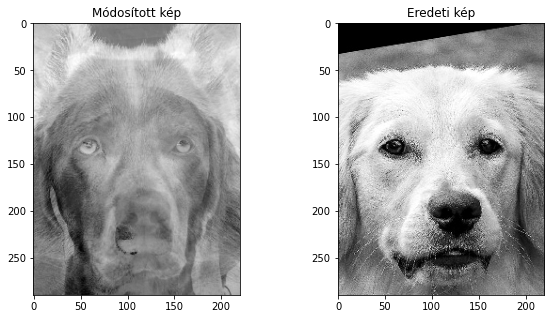

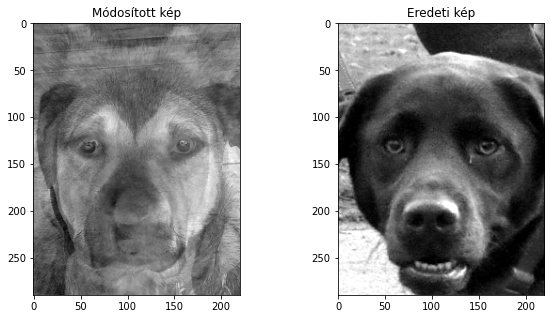

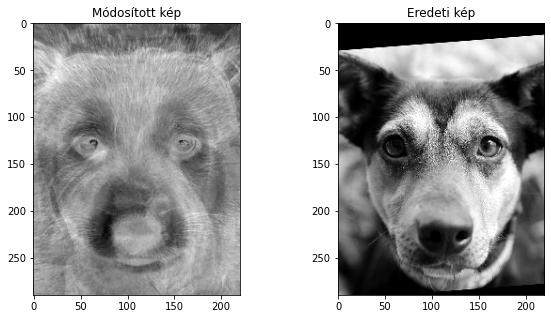

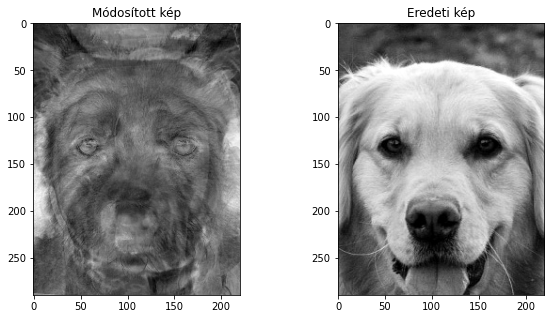

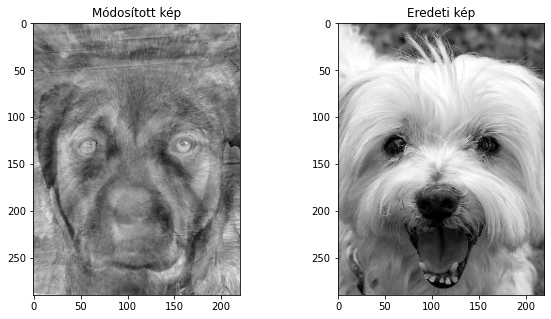

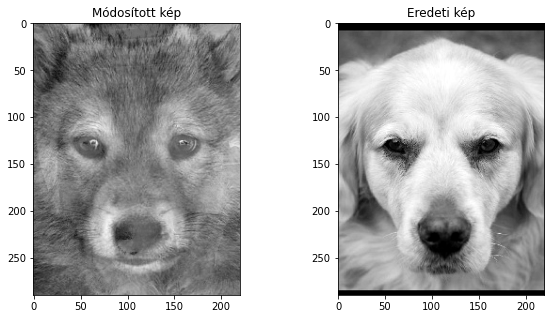

In [97]:
for i in range(0, 7):
    img1 = transzfolmaltsajatvektoruj[i].reshape(h2, w2)
    img2 = imgs2[i]

    # create a figure with two subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # plot the first image on the first subplot
    axs[0].imshow(img1, cmap='gray')

    # plot the second image on the second subplot
    axs[1].imshow(img2, cmap='gray')

    # set the titles for the subplots
    axs[0].set_title('Módosított kép')
    axs[1].set_title('Eredeti kép')

    # show the figure
    plt.show()

In [98]:
#A kifejtett képeken a főbb jellemzők, mint az orr, fül megfigyelhetők, ám a megkapott képek nem hasonlítanak az eredetihez,
#ugyanakkor az SVD-módszerrel és a kovarianciamátrixok módszerével egymáshoz nagyon hasonló módosított képet kapunk.

# <font color='green5'>5. Szorgalmi feladatrész</font>

A PCA egyik első felhasználása az automatikus arcfelismerés területén volt. Ebben az esetben lényegében azt a kérdést kell megválaszolni, hogy egy újonnan beérkező arckép vajon szerepel-e egy már létező adatbázisban. Ezt a következőképp lehet gyorsan eldönteni: az adatbázisban szereplő képekhez tartozó főkomponenseket együtthatókat
már eltároltuk egy-egy vektorban (praktikusan egy mátrixba összegyűjtve). 
Ezután az új fényképre is meghatározzuk a főkomponens együtthatókat és ezt is eltároljuk egy vektorban. Majd kiszámoljuk az adatbázishoz tartozó főkomponens együttható vektorok és az új kép megfelelő vektora közötti euklideszi távolságokat. Ez alatt a különbségvektor négyzetes normáját értjük.
Ha a távolságok közül valamelyik egy bizonyos határérték alatt van, akkor megállapíthatjuk, hogy az új fénykép már szerepel az adatbázisban. 

A 4-es feladatrészben használt $7$ fénykép mindegyikére végezzük el ezt a vizsgálatot! Mindegyikre írassuk ki, hogy az eredeti $94$ kutya-arc közül melyikhez van legközelebb és mennyi a távolság; valamint ábrázoljuk a beazonosítandó képet és az eredeti adatbázisban hozzá legközelebb levő képet egymás mellett! Próbáljuk eldönteni, van-e olyan távolság érték, amely alatt nyugodtan mondhatjuk, hogy a viszgált kutya-arc már szerepelt az adatbázisban.

